# 🦺 RT-DETRv4-X — PPE Detection: **Testing Notebook**
> **What this notebook does:**
> 1. Install deps & mount Drive
> 2. Load your `best.pt` model
> 3. Run inference on a **custom input video** → annotated output video → download
> 4. Run inference on **custom image(s)** you upload
> 5. Run inference on **random test-set images** with violation summary

---
**Classes detected:**
| ID | Label | Colour |
|---|---|---|
| 0 | Helmet | 🟢 Green |
| 1 | No Helmet | 🔴 Red |
| 2 | Safety Vest | 🔵 Cyan |
| 3 | No Safety Vest | 🟠 Orange |

---
## Cell 1 — Install Dependencies & Mount Drive

In [1]:
# ── Install ──────────────────────────────────────────────────────────────────
!pip install -q ultralytics supervision pandas matplotlib

import torch, os, random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
from pathlib import Path
from IPython.display import display, HTML, Video
import supervision as sv

# GPU check
if torch.cuda.is_available():
    print(f"✅ GPU: {torch.cuda.get_device_name(0)}  |  VRAM: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")
else:
    print("⚠️  No GPU — inference will be slower on CPU.")

# Mount Drive
from google.colab import drive
drive.mount('/drive')
print("✅ Drive mounted.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.4/217.4 kB 24.9 MB/s eta 0:00:00
✅ GPU: Tesla T4  |  VRAM: 15.6 GB
Mounted at /drive
✅ Drive mounted.


---
## Cell 2 — ⚙️ Configuration
**Edit the paths below to match your setup.**

In [8]:
import os
from pathlib import Path

MODEL_PT = "/drive/MyDrive/ppe_results/weights/best.pt"
INPUT_VIDEO = "/drive/MyDrive/ppe_results/input_video.mp4"
TEST_IMG_DIR = "/drive/MyDrive/ppe_results/test_images"
OUTPUT_DIR = "/drive/MyDrive/ppe_results/test_outputs"
CONF_THR = 0.45
IMGSZ = 640

CLASS_NAMES   = ["Helmet", "No Helmet", "Safety Vest", "No Safety Vest"]
COMPLIANT_IDS = {0, 2}
VIOLATION_IDS = {1, 3}

COLOR_MAP = {
    0: (0, 220, 0),
    1: (0, 0, 220),
    2: (255, 200, 0),
    3: (0, 140, 255),
}

os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f"✅ Config ready.")
print(f"   Model  : {MODEL_PT}")
print(f"   Video  : {INPUT_VIDEO}")
print(f"   Output : {OUTPUT_DIR}")

✅ Config ready.
   Model  : /drive/MyDrive/ppe_results/weights/best.pt
   Video  : /drive/MyDrive/ppe_results/input_video.mp4
   Output : /drive/MyDrive/ppe_results/test_outputs


---
## Cell 3 — Load Model

In [9]:
from google.colab import drive
drive.mount('/drive', force_remount=False)

from ultralytics import RTDETR

assert Path(MODEL_PT).exists(), f"❌ Model not found at: {MODEL_PT}"
model = RTDETR(MODEL_PT)
print(f"✅ Model loaded: {MODEL_PT}")
print(f"   Classes : {model.names}")

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).
✅ Model loaded: /drive/MyDrive/ppe_results/weights/best.pt
   Classes : {0: 'Helmet', 1: 'No Helmet', 2: 'Safety Vest', 3: 'No Safety Vest'}


---
## Cell 4 — 🎬 Video Inference → Annotated Output → Download
Processes every frame, draws bounding boxes (green = compliant, red = violation),
writes an annotated `.mp4`, and offers a Colab download button.

In [12]:
from ultralytics import RTDETR
import cv2, os, time
from pathlib import Path
from IPython.display import FileLink, display
from google.colab import files as colab_files

assert Path(INPUT_VIDEO).exists(), f"❌ Video not found: {INPUT_VIDEO}"

OUTPUT_VIDEO = str(Path(OUTPUT_DIR) / (Path(INPUT_VIDEO).stem + "_annotated.mp4"))

cap = cv2.VideoCapture(INPUT_VIDEO)
fps    = cap.get(cv2.CAP_PROP_FPS) or 25
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
total  = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"📹 Input  : {INPUT_VIDEO}")
print(f"   {width}x{height} @ {fps:.1f} fps  |  {total} frames")

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter(OUTPUT_VIDEO, fourcc, fps, (width, height))

frame_idx   = 0
total_comp  = 0
total_viol  = 0
t0          = time.time()

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model.predict(frame, conf=CONF_THR, imgsz=IMGSZ, verbose=False)[0]
    boxes   = results.boxes

    if boxes is not None and len(boxes) > 0:
        for box in boxes:
            cls  = int(box.cls[0])
            conf = float(box.conf[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            color = COLOR_MAP.get(cls, (255, 255, 255))

            # Bounding box
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)

            # Label background + text
            label = f"{CLASS_NAMES[cls]} {conf:.2f}"
            (lw, lh), bl = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.55, 1)
            cv2.rectangle(frame, (x1, y1 - lh - bl - 6), (x1 + lw + 4, y1), color, -1)
            cv2.putText(frame, label, (x1 + 2, y1 - bl - 2),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255, 255, 255), 1, cv2.LINE_AA)

            if cls in COMPLIANT_IDS:
                total_comp += 1
            else:
                total_viol += 1

    # Overlay frame counter
    cv2.putText(frame, f"Frame {frame_idx+1}/{total}",
                (10, height - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (200, 200, 200), 1)

    writer.write(frame)
    frame_idx += 1

    if frame_idx % 50 == 0:
        elapsed = time.time() - t0
        print(f"  Processed {frame_idx}/{total} frames  ({elapsed:.1f}s)")

cap.release()
writer.release()

elapsed = time.time() - t0
print(f"\n✅ Done — {frame_idx} frames in {elapsed:.1f}s  ({frame_idx/elapsed:.1f} FPS)")
print(f"   Compliant detections : {total_comp}")
print(f"   Violation detections : {total_viol}")
print(f"   Saved to : {OUTPUT_VIDEO}")

# ── Re-encode to H.264 so Colab can preview it ──────────────────────────────
H264_VIDEO = OUTPUT_VIDEO.replace(".mp4", "_h264.mp4")
!ffmpeg -y -i "{OUTPUT_VIDEO}" -vcodec libx264 -crf 23 -preset fast "{H264_VIDEO}" -loglevel quiet
print(f"   H.264 version: {H264_VIDEO}")

# ── Download button ──────────────────────────────────────────────────────────
print("\n⬇️  Downloading annotated video to your computer...")
colab_files.download(H264_VIDEO)

📹 Input  : /drive/MyDrive/ppe_results/input_video.mp4
   1280x720 @ 24.0 fps  |  192 frames
  Processed 50/192 frames  (7.7s)
  Processed 100/192 frames  (12.0s)
  Processed 150/192 frames  (17.0s)

✅ Done — 192 frames in 20.8s  (9.2 FPS)
   Compliant detections : 2097
   Violation detections : 302
   Saved to : /drive/MyDrive/ppe_results/test_outputs/input_video_annotated.mp4
   H.264 version: /drive/MyDrive/ppe_results/test_outputs/input_video_annotated_h264.mp4

⬇️  Downloading annotated video to your computer...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---
## Cell 5 — 🖼️ Custom Image Testing
**Option A:** Upload images directly in this cell.  
**Option B:** Point `TEST_IMG_DIR` in Cell 2 to a folder on Drive.  
Both options show annotated results in a grid.

In [27]:
import os
from pathlib import Path

CUSTOM_IMG_DIR = "/drive/MyDrive/ppe_results/input_pics"
os.makedirs(CUSTOM_IMG_DIR, exist_ok=True)

CUSTOM_IMAGES = [
    str(p) for p in Path(CUSTOM_IMG_DIR).iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp",".webp"}
]

print(f"✅ Using folder: {CUSTOM_IMG_DIR}")
print(f"   Found {len(CUSTOM_IMAGES)} image(s): {[Path(p).name for p in CUSTOM_IMAGES]}")

✅ Using folder: /drive/MyDrive/ppe_results/input_pics
   Found 4 image(s): ['p3.webp', 'p2.webp', 'p1.webp', 'p4.webp']


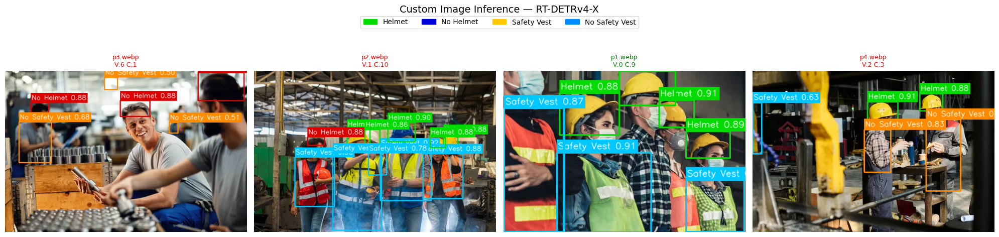


📊 Inference Summary:


,Image,Compliant Detections,Violation Detections,Violation Types
0,p3.webp,1,6,"No Safety Vest, No Helmet"
1,p2.webp,10,1,No Helmet
2,p1.webp,9,0,None
3,p4.webp,3,2,No Safety Vest



✅ Annotated images saved to: /drive/MyDrive/ppe_results/test_outputs
⬇️  Downloading annotated images zip...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
# ── Run inference & display grid ─────────────────────────────────────────────
assert len(CUSTOM_IMAGES) > 0, "No images to process — run Cell 5a or 5b first."

def annotate_image(img_bgr, boxes):
    """Draw boxes on a BGR frame, return RGB for matplotlib."""
    frame = img_bgr.copy()
    if boxes is not None and len(boxes) > 0:
        for box in boxes:
            cls  = int(box.cls[0])
            conf = float(box.conf[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            color = COLOR_MAP.get(cls, (200, 200, 200))
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            label = f"{CLASS_NAMES[cls]} {conf:.2f}"
            (lw, lh), bl = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.55, 1)
            cv2.rectangle(frame, (x1, y1-lh-bl-6), (x1+lw+4, y1), color, -1)
            cv2.putText(frame, label, (x1+2, y1-bl-2),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255,255,255), 1, cv2.LINE_AA)
    return cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

n      = len(CUSTOM_IMAGES)
ncols  = min(n, 4)
nrows  = (n + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
axes = np.array(axes).flatten() if n > 1 else [axes]

rows_data = []
saved_imgs = []

for i, img_path in enumerate(CUSTOM_IMAGES):
    frame  = cv2.imread(img_path)
    result = model.predict(img_path, conf=CONF_THR, imgsz=IMGSZ, verbose=False)[0]
    boxes  = result.boxes

    comp = sum(1 for b in (boxes if boxes else []) if int(b.cls[0]) in COMPLIANT_IDS)
    viol = sum(1 for b in (boxes if boxes else []) if int(b.cls[0]) in VIOLATION_IDS)
    vlabels = [CLASS_NAMES[int(b.cls[0])] for b in (boxes if boxes else [])
               if int(b.cls[0]) in VIOLATION_IDS]

    annotated = annotate_image(frame, boxes)
    axes[i].imshow(annotated)
    axes[i].axis("off")
    tc = "red" if viol > 0 else "green"
    axes[i].set_title(f"{Path(img_path).name}\nV:{viol} C:{comp}",
                      color=tc, fontsize=9)

    # Save annotated image
    out_path = str(Path(OUTPUT_DIR) / ("custom_" + Path(img_path).stem + "_annotated.jpg"))
    cv2.imwrite(out_path, cv2.cvtColor(annotated, cv2.COLOR_RGB2BGR))
    saved_imgs.append(out_path)

    rows_data.append({
        "Image": Path(img_path).name,
        "Compliant Detections": comp,
        "Violation Detections": viol,
        "Violation Types": ", ".join(set(vlabels)) if vlabels else "None",
    })

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Legend
legend_patches = [
    mpatches.Patch(color=(0/255, 220/255, 0/255),   label="Helmet"),
    mpatches.Patch(color=(0/255, 0/255, 220/255),   label="No Helmet"),
    mpatches.Patch(color=(255/255, 200/255, 0/255), label="Safety Vest"),
    mpatches.Patch(color=(0/255, 140/255, 255/255), label="No Safety Vest"),
]
fig.legend(handles=legend_patches, loc="upper center", ncol=4, fontsize=10,
           bbox_to_anchor=(0.5, 1.02))
plt.suptitle("Custom Image Inference — RT-DETRv4-X", fontsize=14, y=1.05)
plt.tight_layout()

grid_path = str(Path(OUTPUT_DIR) / "custom_images_grid.png")
plt.savefig(grid_path, dpi=150, bbox_inches="tight")
plt.show()

# Summary table
df = pd.DataFrame(rows_data)
print("\n📊 Inference Summary:")
display(df)
print(f"\n✅ Annotated images saved to: {OUTPUT_DIR}")

# Download all annotated images as a zip
import zipfile
zip_path = "/content/custom_annotated_images.zip"
with zipfile.ZipFile(zip_path, "w") as zf:
    for p in saved_imgs:
        zf.write(p, Path(p).name)
    zf.write(grid_path, "grid.png")

print("⬇️  Downloading annotated images zip...")
colab_files.download(zip_path)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 69.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
✅ Target layer ready
Found 4 image(s): ['p1.webp', 'p2.webp', 'p3.webp', 'p4.webp']

Processing p1.webp ...


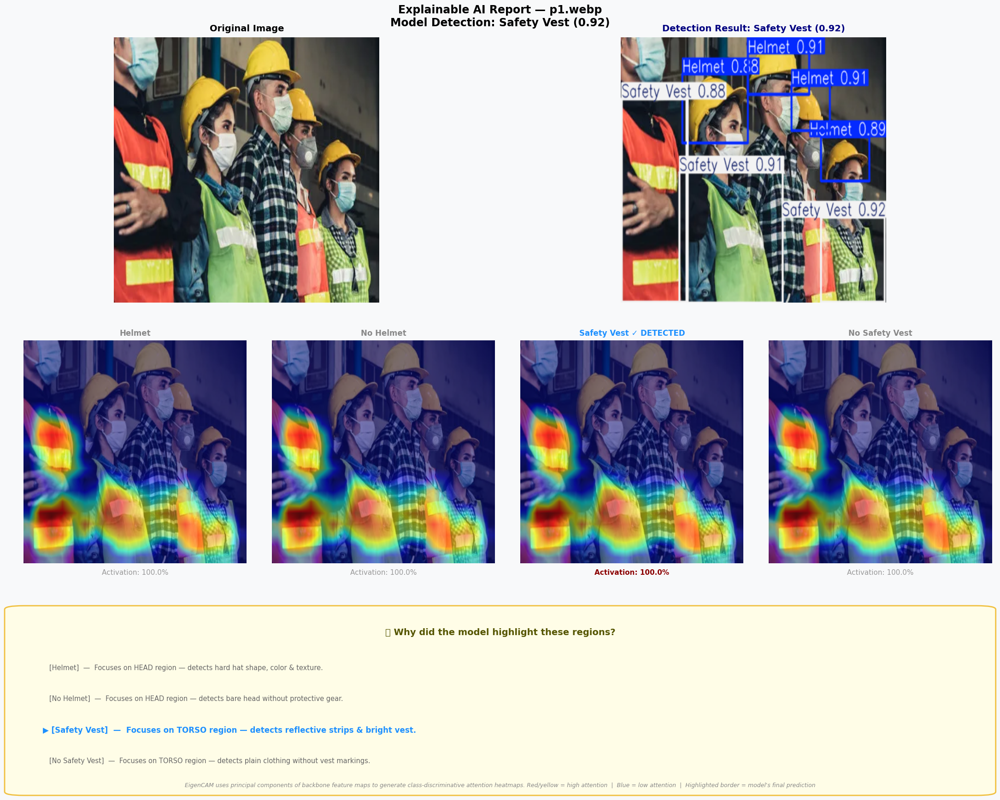

  ✅ Saved: /drive/MyDrive/ppe_results/output/xai_p1.png

Processing p2.webp ...


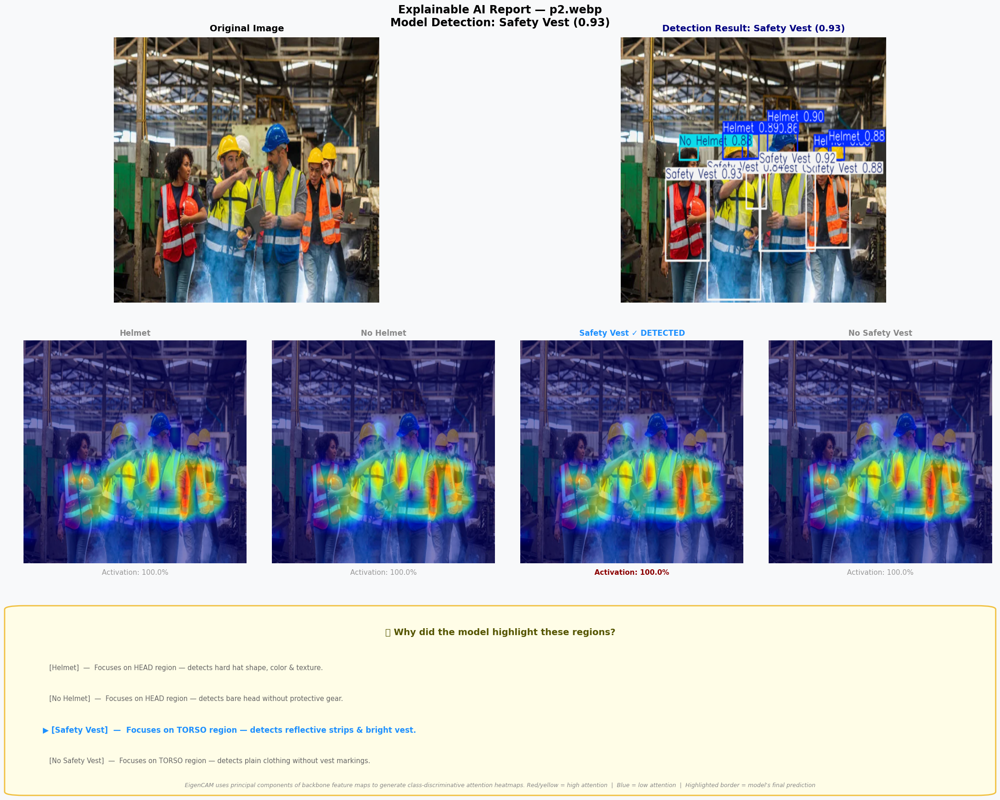

  ✅ Saved: /drive/MyDrive/ppe_results/output/xai_p2.png

Processing p3.webp ...


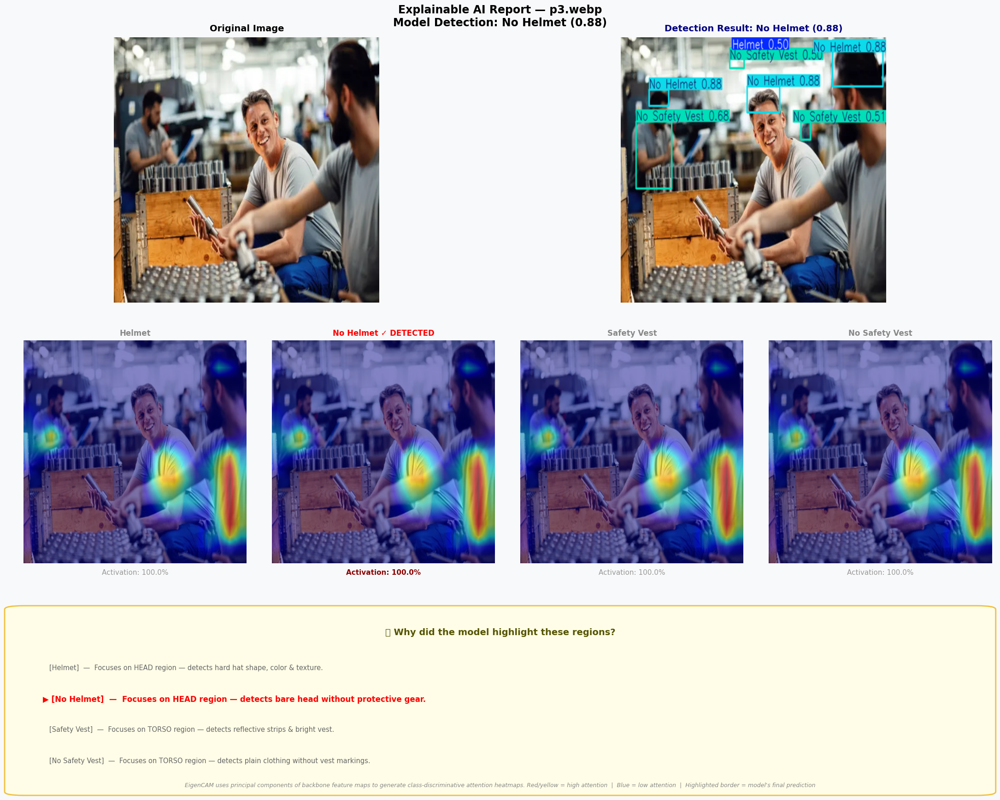

  ✅ Saved: /drive/MyDrive/ppe_results/output/xai_p3.png

Processing p4.webp ...


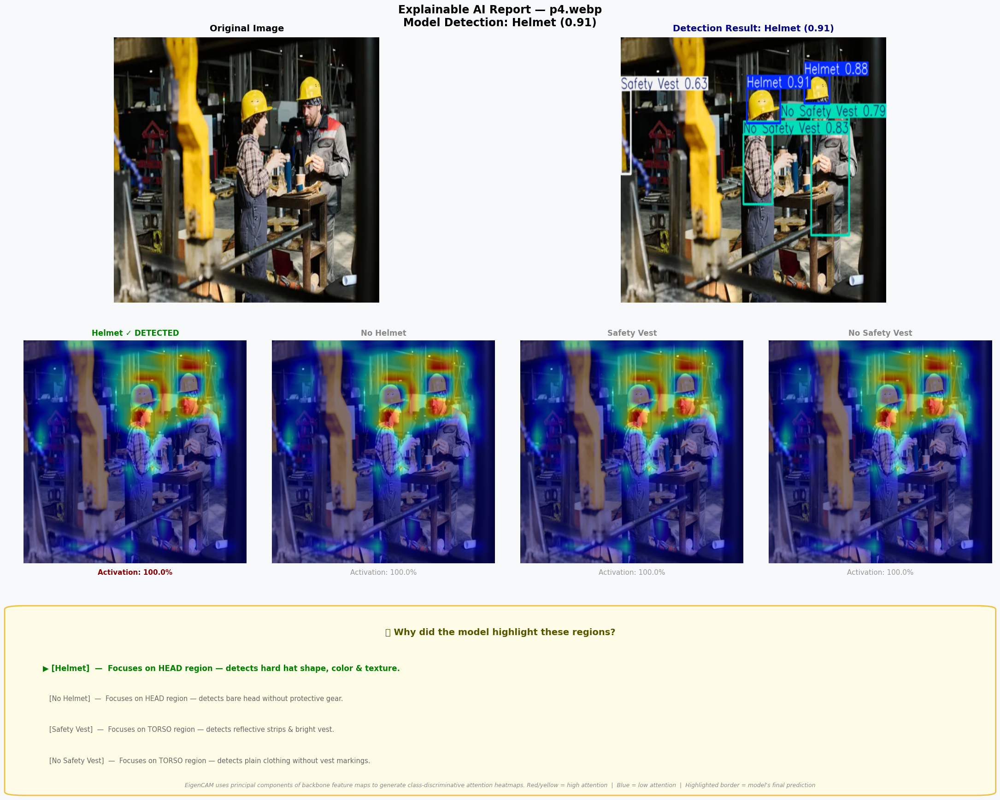

  ✅ Saved: /drive/MyDrive/ppe_results/output/xai_p4.png

✅ All done!


In [29]:
# ── Explainable AI — EigenCAM All 4 Classes ──────────────────────────────────
!pip install -q grad-cam

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import torch
import torch.nn as nn
from ultralytics import RTDETR

# ── Config ────────────────────────────────────────────────────────────────────
MODEL_PT      = "/drive/MyDrive/ppe_results/weights/best.pt"
PICS_DIR      = Path("/drive/MyDrive/ppe_results/input_pics")
XAI_OUT_DIR   = Path("/drive/MyDrive/ppe_results/output")
XAI_OUT_DIR.mkdir(parents=True, exist_ok=True)

CLASS_NAMES   = ["Helmet", "No Helmet", "Safety Vest", "No Safety Vest"]
CLASS_COLORS  = ["green",  "red",       "dodgerblue",  "orange"]
CONF_THR      = 0.5

CLASS_EXPLANATIONS = {
    "Helmet":         "Focuses on HEAD region — detects hard hat shape, color & texture.",
    "No Helmet":      "Focuses on HEAD region — detects bare head without protective gear.",
    "Safety Vest":    "Focuses on TORSO region — detects reflective strips & bright vest.",
    "No Safety Vest": "Focuses on TORSO region — detects plain clothing without vest markings.",
}

# ── Model setup ───────────────────────────────────────────────────────────────
model       = RTDETR(MODEL_PT)
torch_model = model.model.cpu().float()
for _, buf in torch_model.named_buffers():
    buf.data = buf.data.cpu().float()
torch_model.eval()

class RTDETRWrapper(nn.Module):
    def __init__(self, m): super().__init__(); self.model = m
    def forward(self, x):
        out = self.model(x)
        if isinstance(out, (tuple, list)): out = out[0]
        if out.dim() == 3: out = out.max(dim=1).values
        return out

wrapped_model = RTDETRWrapper(torch_model)
wrapped_model.eval()
target_layer  = [torch_model.model[31].cv2.conv]
print("✅ Target layer ready")

def get_cam_for_class(input_tensor, img_float, class_id):
    with EigenCAM(model=wrapped_model, target_layers=target_layer) as cam:
        grayscale_cam = cam(input_tensor=input_tensor,
                            targets=[ClassifierOutputTarget(class_id)])[0]
    return show_cam_on_image(img_float, grayscale_cam, use_rgb=True), \
           float(grayscale_cam.max()) * 100

def run_cam_all_classes(img_path):
    img_bgr     = cv2.imread(str(img_path), cv2.IMREAD_COLOR)
    if img_bgr is None: raise ValueError(f"Cannot read: {img_path}")
    img_rgb     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (640, 640))
    img_float   = img_resized.astype(np.float32) / 255.0
    inp         = torch.from_numpy(img_float).permute(2,0,1).unsqueeze(0).cpu().float()

    preds = model.predict(str(img_path), imgsz=640, conf=CONF_THR, verbose=False)[0]
    if len(preds.boxes) == 0:
        detected_class, pred_label = -1, "No Detection"
    else:
        bi             = preds.boxes.conf.argmax()
        detected_class = int(preds.boxes.cls[bi].item())
        conf           = float(preds.boxes.conf[bi])
        pred_label     = f"{CLASS_NAMES[detected_class]} ({conf:.2f})"

    det_img  = cv2.resize(cv2.cvtColor(np.array(preds.plot()), cv2.COLOR_BGR2RGB), (640, 640))
    heatmaps, scores = [], []
    for cid in range(4):
        h, s = get_cam_for_class(inp, img_float, cid)
        heatmaps.append(h); scores.append(s)

    return img_resized, heatmaps, scores, det_img, pred_label, detected_class

# ── Load images from Drive ────────────────────────────────────────────────────
all_imgs = sorted([
    p for p in PICS_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
])
if not all_imgs:
    raise FileNotFoundError(f"No images found in {PICS_DIR}")
print(f"Found {len(all_imgs)} image(s): {[p.name for p in all_imgs]}\n")

# ── Plot & Save ───────────────────────────────────────────────────────────────
for img_path in all_imgs:
    print(f"Processing {img_path.name} ...")
    try:
        original, heatmaps, scores, det_img, pred_label, detected_class = \
            run_cam_all_classes(img_path)

        fig = plt.figure(figsize=(22, 18))
        fig.patch.set_facecolor("#f8f9fa")

        fig.suptitle(
            f"Explainable AI Report — {img_path.name}\nModel Detection: {pred_label}",
            fontsize=17, fontweight='bold', y=0.98, color='black'
        )

        ax_orig = fig.add_axes([0.03, 0.62, 0.44, 0.32])
        ax_det  = fig.add_axes([0.53, 0.62, 0.44, 0.32])
        ax_orig.imshow(original)
        ax_orig.set_title("Original Image", fontsize=14, fontweight='bold', pad=10)
        ax_orig.axis("off")
        ax_det.imshow(det_img)
        ax_det.set_title(f"Detection Result: {pred_label}", fontsize=14,
                         fontweight='bold', pad=10, color='navy')
        ax_det.axis("off")

        for i in range(4):
            ax = fig.add_axes([0.03 + i * 0.245, 0.30, 0.22, 0.28])
            ax.imshow(heatmaps[i])
            ax.axis("off")
            is_det = (i == detected_class)
            color  = CLASS_COLORS[i]
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_edgecolor(color if is_det else "#cccccc")
                spine.set_linewidth(5 if is_det else 1)
            ax.set_title(CLASS_NAMES[i] + (" ✓ DETECTED" if is_det else ""),
                         fontsize=12, fontweight='bold',
                         color=color if is_det else '#888888', pad=8)
            ax.text(0.5, -0.05, f"Activation: {scores[i]:.1f}%",
                    transform=ax.transAxes, fontsize=11, ha='center',
                    color='darkred' if is_det else '#999999',
                    fontweight='bold' if is_det else 'normal')

        ax_exp = fig.add_axes([0.03, 0.03, 0.94, 0.22])
        ax_exp.axis("off")
        ax_exp.add_patch(mpatches.FancyBboxPatch(
            (0, 0), 1, 1, boxstyle="round,pad=0.02",
            transform=ax_exp.transAxes,
            facecolor="#fffde7", edgecolor="#f0c040", linewidth=2, clip_on=False
        ))
        ax_exp.text(0.5, 0.90, "💡 Why did the model highlight these regions?",
                    transform=ax_exp.transAxes, fontsize=14, fontweight='bold',
                    ha='center', va='top', color='#555500')
        for i, cname in enumerate(CLASS_NAMES):
            is_det = (i == detected_class)
            ax_exp.text(0.02, 0.70 - i * 0.17,
                        f"{'▶ ' if is_det else '   '}[{cname}]  —  {CLASS_EXPLANATIONS[cname]}",
                        transform=ax_exp.transAxes,
                        fontsize=12 if is_det else 10.5,
                        fontweight='bold' if is_det else 'normal',
                        ha='left', va='top',
                        color=CLASS_COLORS[i] if is_det else '#666666')
        ax_exp.text(0.5, 0.02,
                    "EigenCAM uses principal components of backbone feature maps to generate "
                    "class-discriminative attention heatmaps. "
                    "Red/yellow = high attention  |  Blue = low attention  |  "
                    "Highlighted border = model's final prediction",
                    transform=ax_exp.transAxes, fontsize=9,
                    ha='center', va='bottom', color='#888888', style='italic')

        save_path = XAI_OUT_DIR / f"xai_{img_path.stem}.png"
        plt.savefig(str(save_path), dpi=150, bbox_inches="tight",
                    facecolor=fig.get_facecolor())
        plt.show()
        print(f"  ✅ Saved: {save_path}\n")

    except Exception as e:
        import traceback; traceback.print_exc()
        print(f"  ⚠️ Skipped {img_path.name}: {e}\n")

print("✅ All done!")